## False Positive Census: looking at DIASource flags

Import all the things

In [2]:
%matplotlib notebook
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sqlite3
import itertools
import importlib

from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize
import astropy.units as u
import astropy.coordinates as coord

import lsst.geom
import lsst.daf.persistence as dafPersist
import lsst.afw.display as afwDisplay
afwDisplay.setDefaultBackend('matplotlib')

Import some custom functions

In [3]:
sys.path.append('/project/mrawls/ap_pipe-notebooks/')

In [4]:
from diaObjectAnalysis import loadAllPpdbObjects, plotDiaObjectsOnSky #, setObjectFilter
import plotLightcurve as plc  # in_ipynb, loadPpdbObjects, loadPpdbSources, patchFinder, plotLightcurve

Execute the following cell if you change anything in the custom functions imported above

In [18]:
importlib.reload(plc)

<module 'plotLightcurve' from '/project/mrawls/ap_pipe-notebooks/plotLightcurve.py'>

In [5]:
repo = '/project/mrawls/hits2015/rerun/cw_processed5'
butler = dafPersist.Butler(repo)
dbPath = os.path.join(repo, 'association.db')

In [6]:
objTable = loadAllPpdbObjects(repo)

In [7]:
len(objTable)

470419

In [8]:
objTable[0:3]

,diaObjectId,ra,decl,nDiaSources,gPSFluxMean,validityEnd,flags
0,176486854802014420,150.127929,1.814168,1,129750.843750,None,1
1,176486854802014437,150.151781,1.873059,1,-1901.032959,None,1
2,176486854802014439,150.156033,1.788120,1,2648.088379,None,0


In [41]:
len(objTable)

470419

Let's load up a PPDB from a recent ap_verify run on the CI dataset so we can plot it and make RA/Dec cuts in our massive ginormo objTable so we don't try to load sources for 470k objects

In [44]:
repo_ci = '/project/mrawls/defect_party/rerun/new_defects2'
objTableCi = loadAllPpdbObjects(repo_ci)
nullCiFilter = (objTableCi['nDiaSources'] > 0)

In [46]:
len(objTableCi)

1822

<IPython.core.display.Javascript object>


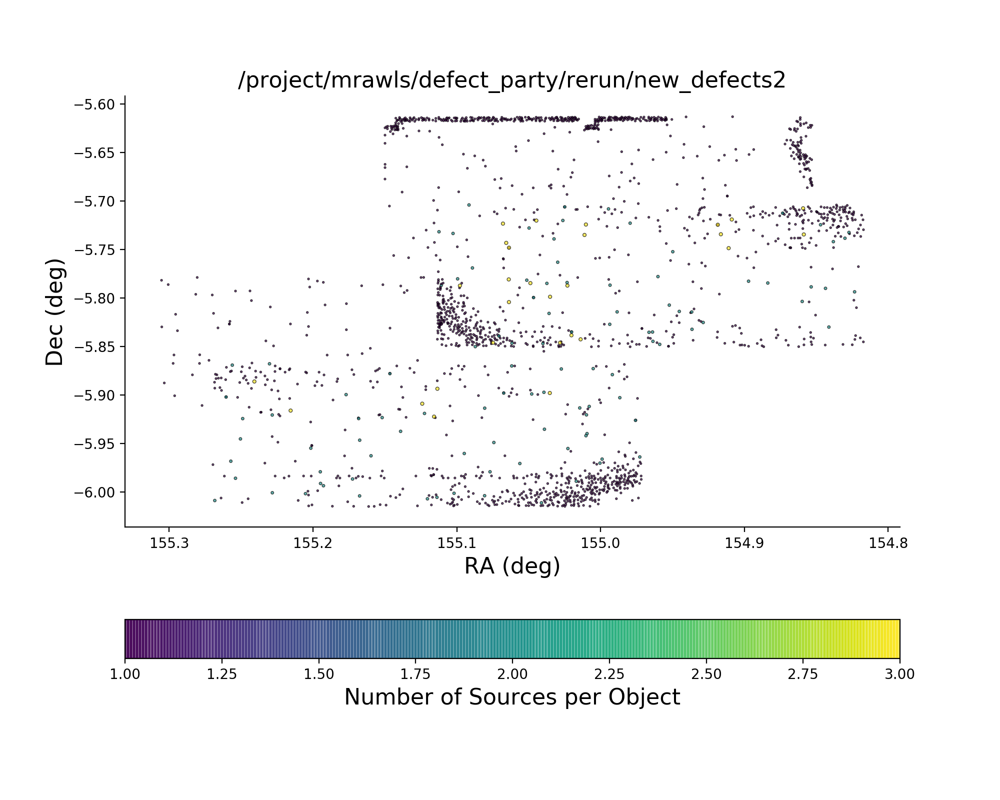

In [51]:
fig = plotDiaObjectsOnSky(repo_ci, objTableCi, nullCiFilter, hits=False)

In [9]:
miniDataset = ((objTable['ra'] > 154.8) & (objTable['ra'] < 155.3) &
               (objTable['decl'] > -6.02) & (objTable['decl'] < -5.60))  # CI region plus nearby friends
len(objTable.loc[miniDataset, 'diaObjectId'])

10735

In [19]:
srcTable = pd.DataFrame()
for obj in objTable.loc[miniDataset, 'diaObjectId']:
    sources = plc.loadPpdbSources(dbPath, obj)
    srcTable = pd.concat([srcTable, sources], sort=True).reset_index(drop=True)

In [20]:
srcTable[0:3]

,apFlux,apFluxErr,ccdVisitId,decl,diaObjectId,diaSourceId,flags,midPointTai,psFlux,psFluxErr,ra,totFlux,totFluxErr
0,287.959046,745.433945,41092910,-5.907236,176492704547471526,176492704547471526,2176,57070.160574,1507.841719,226.007753,155.005946,17875.057609,224.168784
1,236.576263,722.143596,41092910,-5.983683,176492704547471534,176492704547471534,159383880,57070.160574,1153.281402,213.625137,155.037101,17564.315773,211.059976
2,9.003694,721.827248,41092910,-5.981570,176492704547471540,176492704547471540,328,57070.160574,1088.049979,214.588052,155.054999,17546.294840,211.849709


In [58]:
miniObjTable = objTable.loc[miniDataset]

Let's add the RA and Dec from the object table to this as well.

In [59]:
raObj = []
decObj = []
for index, src in srcTable.iterrows():  # loop over source table
    diaObjectId = np.int64(src['diaObjectId'])  # this needs to be an int ?!
    ra = miniObjTable.loc[miniObjTable['diaObjectId'] == diaObjectId, 'ra']
    dec = miniObjTable.loc[miniObjTable['diaObjectId'] == diaObjectId, 'decl']
    try:
        raObj.append(ra.values[0])
        decObj.append(dec.values[0])
    except:  # some of the objects don't appear to have an RA and Dec because the .locs above are wonky?!?!
        #print(diaObjectId)
        raObj.append(np.nan)
        decObj.append(np.nan)

In [60]:
print(len(srcTable), len(raObj), len(decObj))

28528 28528 28528


In [61]:
srcTable['raObj'] = raObj
srcTable['decObj'] = decObj

In [62]:
srcTable[0:3]

,apFlux,apFluxErr,ccdVisitId,decl,diaObjectId,diaSourceId,flags,midPointTai,psFlux,psFluxErr,ra,totFlux,totFluxErr,raObj,decObj
0,287.959046,745.433945,41092910,-5.907236,176492704547471526,176492704547471526,2176,57070.160574,1507.841719,226.007753,155.005946,17875.057609,224.168784,154.989024,-6.006998
1,236.576263,722.143596,41092910,-5.983683,176492704547471534,176492704547471534,159383880,57070.160574,1153.281402,213.625137,155.037101,17564.315773,211.059976,154.989024,-6.006998
2,9.003694,721.827248,41092910,-5.981570,176492704547471540,176492704547471540,328,57070.160574,1088.049979,214.588052,155.054999,17546.294840,211.849709,155.102801,-5.926821


In [64]:
print(srcTable['raObj'].isna().sum(), srcTable['decObj'].isna().sum())

10609 10609


<IPython.core.display.Javascript object>


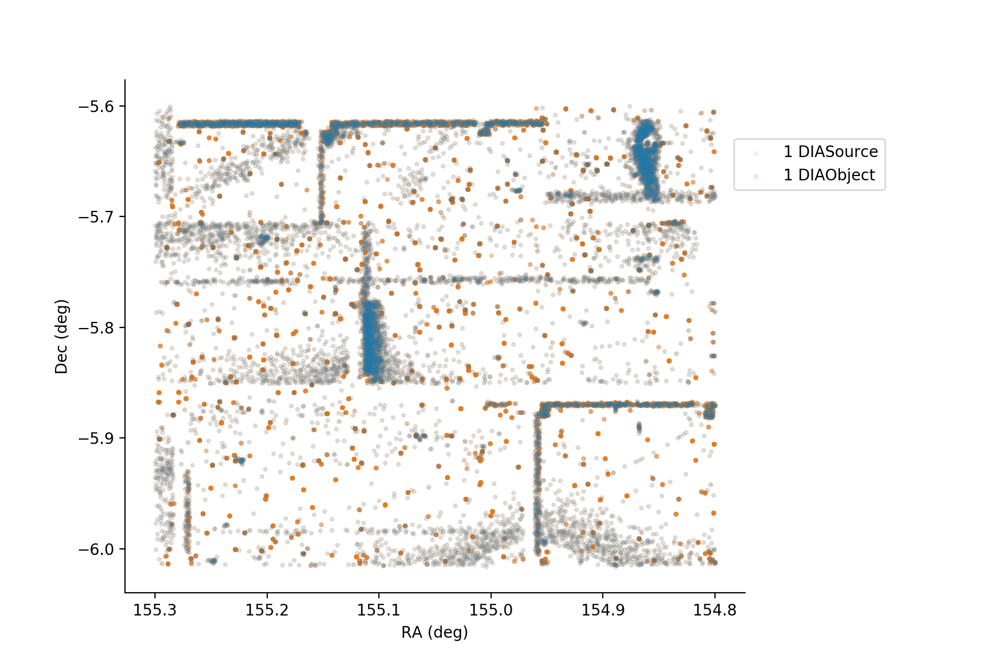

In [116]:
fig = plt.figure(figsize=(9,6))
#plt.scatter(srcTable['raObj'], srcTable['decObj'], color='C0', s=10, alpha=0.5)  # missing lots of entries
plt.scatter(srcTable['ra'], srcTable['decl'], color='C1', s=5, alpha=0.1, label='1 DIASource')
plt.scatter(miniObjTable['ra'], miniObjTable['decl'], color='C0', s=5, alpha=0.1, label='1 DIAObject')
plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
#plt.gca().set_xlim(155.3, 154.8)
#plt.gca().set_ylim(-6.02, -5.60)
plt.gca().invert_xaxis()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
plt.legend(bbox_to_anchor=(0.97, 0.9))

In [460]:
len(srcTable)

28528

In [464]:
srcTable['raObj'].isnull().sum()  # wait so like 1/3 of these sources don't have RA/Decs in the object table?!

9642

In [465]:
srcTable[0:3]

,apFlux,apFluxErr,ccdVisitId,diaObjectId,diaSourceId,flags,midPointTai,psFlux,psFluxErr,totFlux,totFluxErr,raObj,decObj
0,287.959046,745.433945,41092910,176492704547471526,176492704547471526,2176,57070.160574,1507.841719,226.007753,17875.057609,224.168784,154.989024,-6.006998
1,236.576263,722.143596,41092910,176492704547471534,176492704547471534,159383880,57070.160574,1153.281402,213.625137,17564.315773,211.059976,154.989024,-6.006998
2,9.003694,721.827248,41092910,176492704547471540,176492704547471540,328,57070.160574,1088.049979,214.588052,17546.294840,211.849709,155.102801,-5.926821


OK good, we only loaded 28k sources, that is work-with-able. Let's make a histogram we know how to make.

<IPython.core.display.Javascript object>


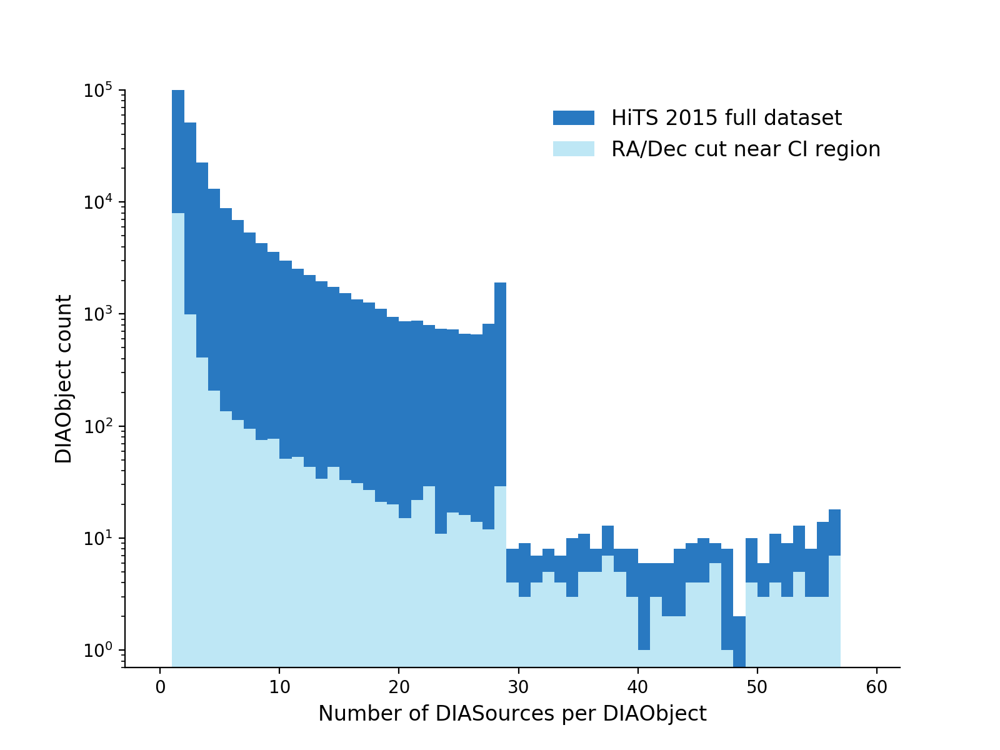

In [83]:
plt.figure(figsize=(8, 6))
plt.xlabel('Number of DIASources per DIAObject', size=12)
plt.ylabel('DIAObject count', size=12)
plt.ylim(0.7, 1e5)
plt.yscale('log')
plt.hist(objTable['nDiaSources'].values, bins=np.arange(0, 60), color='#2979C1', label='HiTS 2015 full dataset')
plt.hist(miniObjTable['nDiaSources'].values, bins=np.arange(0, 60), color='#Bee7F5', label='RA/Dec cut near CI region')
plt.legend(frameon=False, fontsize=12)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

OK, good to know we are dealing with something akin to a representative subset. On to flags!

In [84]:
from lsst.ap.association import UnpackPpdbFlags, MapDiaSourceConfig
from lsst.utils import getPackageDir

In [86]:
config = MapDiaSourceConfig()
unpacker = UnpackPpdbFlags(config.flagMap, 'DiaSource')

In [87]:
flag_values = unpacker.unpack(srcTable['flags'], 'flags')

In [88]:
flag_names = list(flag_values.dtype.names)

In [89]:
flag_names

['base_PixelFlags_flag',
 'base_PixelFlags_flag_offimage',
 'base_PixelFlags_flag_edge',
 'base_PixelFlags_flag_interpolated',
 'base_PixelFlags_flag_saturated',
 'base_PixelFlags_flag_cr',
 'base_PixelFlags_flag_bad',
 'base_PixelFlags_flag_suspect',
 'base_PixelFlags_flag_interpolatedCenter',
 'base_PixelFlags_flag_saturatedCenter',
 'base_PixelFlags_flag_crCenter',
 'base_PixelFlags_flag_suspectCenter',
 'slot_Centroid_flag',
 'slot_Centroid_pos_flag',
 'slot_Centroid_neg_flag',
 'slot_ApFlux_flag',
 'slot_ApFlux_flag_apertureTruncated',
 'slot_PsfFlux_flag',
 'slot_PsfFlux_flag_noGoodPixels',
 'slot_PsfFlux_flag_edge',
 'ip_diffim_forced_PsfFlux_flag',
 'ip_diffim_forced_PsfFlux_flag_noGoodPixels',
 'ip_diffim_forced_PsfFlux_flag_edge',
 'slot_Shape_flag',
 'slot_Shape_flag_unweightedBad',
 'slot_Shape_flag_unweighted',
 'slot_Shape_flag_shift',
 'slot_Shape_flag_maxIter',
 'slot_Shape_flag_psf']

In [90]:
flag_values[0]

(False, False, False, False, False, False, False, True, False, False, False, True, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False)

Need to figure out how to actually make a histogram out of this information

In [91]:
flagTable = pd.DataFrame(flag_values, index=srcTable.index)

In [92]:
flagTable[0:3]

,base_PixelFlags_flag,base_PixelFlags_flag_offimage,base_PixelFlags_flag_edge,base_PixelFlags_flag_interpolated,base_PixelFlags_flag_saturated,base_PixelFlags_flag_cr,base_PixelFlags_flag_bad,base_PixelFlags_flag_suspect,base_PixelFlags_flag_interpolatedCenter,base_PixelFlags_flag_saturatedCenter,...,slot_PsfFlux_flag_edge,ip_diffim_forced_PsfFlux_flag,ip_diffim_forced_PsfFlux_flag_noGoodPixels,ip_diffim_forced_PsfFlux_flag_edge,slot_Shape_flag,slot_Shape_flag_unweightedBad,slot_Shape_flag_unweighted,slot_Shape_flag_shift,slot_Shape_flag_maxIter,slot_Shape_flag_psf
0,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,True,False,False,True,False,True,False,...,False,False,False,False,True,True,False,False,True,False
2,False,False,False,True,False,False,True,False,True,False,...,False,False,False,False,False,False,False,False,False,False


In [93]:
flagSum = flagTable.sum()

In [94]:
flagSum.index

Index(['base_PixelFlags_flag', 'base_PixelFlags_flag_offimage',
       'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_interpolated',
       'base_PixelFlags_flag_saturated', 'base_PixelFlags_flag_cr',
       'base_PixelFlags_flag_bad', 'base_PixelFlags_flag_suspect',
       'base_PixelFlags_flag_interpolatedCenter',
       'base_PixelFlags_flag_saturatedCenter', 'base_PixelFlags_flag_crCenter',
       'base_PixelFlags_flag_suspectCenter', 'slot_Centroid_flag',
       'slot_Centroid_pos_flag', 'slot_Centroid_neg_flag', 'slot_ApFlux_flag',
       'slot_ApFlux_flag_apertureTruncated', 'slot_PsfFlux_flag',
       'slot_PsfFlux_flag_noGoodPixels', 'slot_PsfFlux_flag_edge',
       'ip_diffim_forced_PsfFlux_flag',
       'ip_diffim_forced_PsfFlux_flag_noGoodPixels',
       'ip_diffim_forced_PsfFlux_flag_edge', 'slot_Shape_flag',
       'slot_Shape_flag_unweightedBad', 'slot_Shape_flag_unweighted',
       'slot_Shape_flag_shift', 'slot_Shape_flag_maxIter',
       'slot_Shape_flag_psf'],
  

In [95]:
labels = ['baseFlag', 'offImage', 'edge', 'interp', 'saturated', 'CR', 'bad', 'suspect', 
          'interpCen', 'saturatedCen', 'CRCen', 'suspectCen', 
          'centroidFlag', 'centroidPosFlag', 'centroidNegFlag',
          'apFluxFlag', 'apTruncated', 'psfFluxFlag', 'noGoodPixels', 'psfFluxFlagEdge',
          'diffimForcedFlag', 'diffimForcedNoGoodPixels', 'diffimForcedEdge', 
          'shapeFlag', 'shapeUnweightedBad', 'shapeUnweighted', 'shapeShift', 'shapeMaxIter', 'shapePsf']

In [96]:
flagSum

base_PixelFlags_flag                              0
base_PixelFlags_flag_offimage                     1
base_PixelFlags_flag_edge                      7514
base_PixelFlags_flag_interpolated             18504
base_PixelFlags_flag_saturated                 2516
base_PixelFlags_flag_cr                       10516
base_PixelFlags_flag_bad                       7820
base_PixelFlags_flag_suspect                  14560
base_PixelFlags_flag_interpolatedCenter       14615
base_PixelFlags_flag_saturatedCenter           2405
base_PixelFlags_flag_crCenter                  7046
base_PixelFlags_flag_suspectCenter            12918
slot_Centroid_flag                                0
slot_Centroid_pos_flag                            0
slot_Centroid_neg_flag                            0
slot_ApFlux_flag                                  2
slot_ApFlux_flag_apertureTruncated                1
slot_PsfFlux_flag                              2198
slot_PsfFlux_flag_noGoodPixels                    1
slot_PsfFlux

In [97]:
flagSum.values

array([    0,     1,  7514, 18504,  2516, 10516,  7820, 14560, 14615,
        2405,  7046, 12918,     0,     0,     0,     2,     1,  2198,
           1,     2,     3,     1,     2, 22590, 17179,  5045,  2259,
         460,     0])

In [101]:
nonzeroFlags = [count for count in flagSum.values if count > 10]
nonzeroLabels = ['edge', 'interp', 'saturated', 'CR', 'bad', 'suspect', 
                 'interpCen', 'saturatedCen', 'CRCen', 'suspectCen', 
                 'psfFluxFlag',
                 'shapeFlag', 'unweightedBad', 'unweighted', 'shapeShift', 'shapeMaxIter']
assert len(nonzeroFlags) == len(nonzeroLabels)

In [105]:
def plot_flag_hist(flags, labels, title=None):
    assert len(flags) == len(labels)
    assert len(flags) == 16  # because we're doing custom slicing below
    fig, ax = plt.subplots(figsize=(8,5))
    pixelflags = ax.bar(labels[0:6], flags[0:6], color='C0')
    pixelcenterflags = ax.bar(labels[6:10], flags[6:10], color='C1')
    fluxflags = ax.bar(labels[10], flags[10], color='C2')
    shapeflags = ax.bar(labels[11::], flags[11::], color='C3')
    ax.xaxis.set_tick_params(rotation=75)
    fig.subplots_adjust(bottom=0.3)
    ax.set_ylabel('Number of flagged DIASources')

    ax.legend((pixelflags[0],
               pixelcenterflags[0],
               fluxflags[0], 
               shapeflags[0]), 
              ('Pixel flags', 
               'Pixel center flags', 
               'psfFlux flags', 
               'Shape flags'),
              frameon=False, loc='best', ncol=2
             )

    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.title(title)
    plt.gca().set_ylim(0, 28528)

<IPython.core.display.Javascript object>


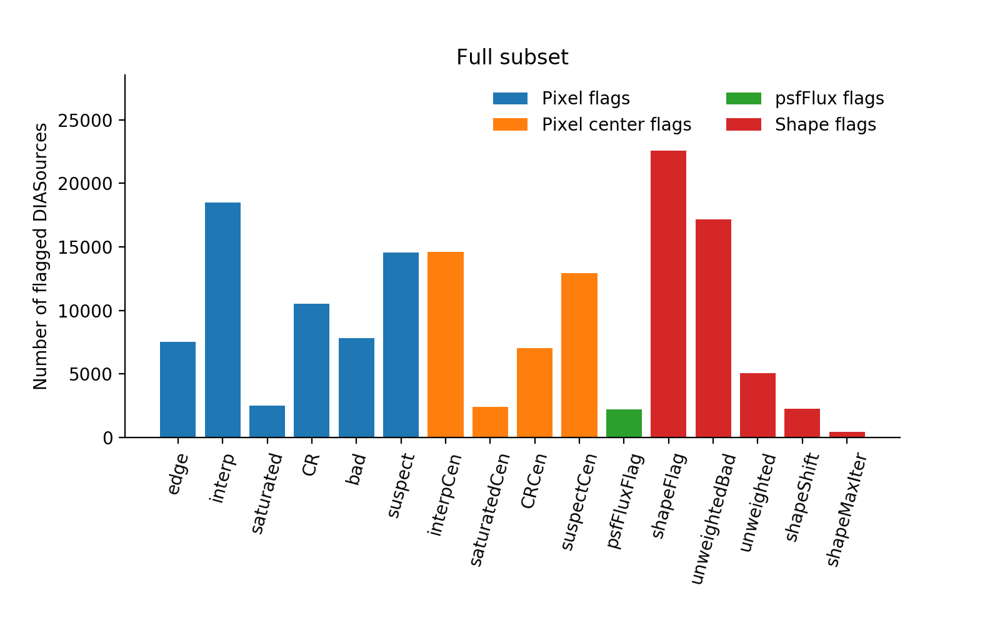

In [107]:
plot_flag_hist(nonzeroFlags, nonzeroLabels, title='Full subset')

Let's review what the flags actually mean.

Pixel flags (we see many of these)

* **base_PixelFlags_flag**: general failure flag, set if anything went wrong
* **base_PixelFlags_flag_offimage**: Source center is off image
* **base_PixelFlags_flag_edge**: Source is outside usable exposure region (masked EDGE or NO_DATA)
* **base_PixelFlags_flag_interpolated**: Interpolated pixel in the Source footprint
* **base_PixelFlags_flag_saturated**: Saturated pixel in the Source footprint
* **base_PixelFlags_flag_cr**: Cosmic ray in the Source footprint
* **base_PixelFlags_flag_bad**: Bad pixel in the Source footprint
* **base_PixelFlags_flag_suspect**: Source's footprint includes suspect pixels

Pixel center flags (we see some of these)

* **base_PixelFlags_flag_interpolatedCenter**: Interpolated pixel in the Source center
* **base_PixelFlags_flag_saturatedCenter**: Saturated pixel in the Source center
* **base_PixelFlags_flag_crCenter**: Cosmic ray in the Source center
* **base_PixelFlags_flag_suspectCenter**: Source's center is close to suspect pixels

Centroid flags (we see none of these at all)

* **slot_Centroid_flag**: general failure flag, set if anything went wrong
* **slot_Centroid_pos_flag**: failure flag for positive, set if anything went wrong
* **slot_Centroid_neg_flag**: failure flag for negative, set if anything went wrong

Aperture flux flags (we see vitually none of these)

* **slot_ApFlux_flag**: General Failure Flag
* **slot_ApFlux_flag_apertureTruncated**: aperture did not fit within measurement image

PSF flux flags (we see a few of these)

* **slot_PsfFlux_flag**: General Failure Flag
* **slot_PsfFlux_flag_noGoodPixels**: not enough non-rejected pixels in data to attempt the fit
* **slot_PsfFlux_flag_edge**: object was too close to the edge of the image to use the full PSF model

ip_diffim forced photometry flags (we see virtually none of these)

* **ip_diffim_forced_PsfFlux_flag**: Forced PSF flux general failure flag.
* **ip_diffim_forced_PsfFlux_flag_noGoodPixels**: Forced PSF flux not enough non-rejected pixels in data to attempt the fit.
* **ip_diffim_forced_PsfFlux_flag_edge**: Forced PSF flux object was too close to the edge of the image to use the full PSF model.

Shape flags (we see loads of these). Shape measurement is presently configured to use the default base_SdssShape. According to the docs, this algorithm measures "the image moments of [a] source using adaptive Gaussian weights."

* **slot_Shape_flag**: General Failure Flag
* **slot_Shape_flag_unweightedBad**: Both weighted and unweighted moments were invalid
* **slot_Shape_flag_unweighted**: Weighted moments converged to an invalid value; using unweighted moments
* **slot_Shape_flag_shift**: centroid shifted by more than the maximum allowed amount
* **slot_Shape_flag_maxIter**: Too many iterations in adaptive moments
* **slot_Shape_flag_psf**: Failure in measuring PSF model shape

In [99]:
badVisits = pd.DataFrame()
notBadVisits = pd.DataFrame()
for index, row in srcTable.iterrows():
    if str(row['ccdVisitId']).startswith('419'):
        badVisits = badVisits.append(row)
    else:
        notBadVisits = notBadVisits.append(row)
badVisits['flags'] = np.int64(badVisits['flags'])  # for some reason everything became float64?
notBadVisits['flags'] = np.int64(notBadVisits['flags'])

In [100]:
print(len(badVisits['ccdVisitId']), len(notBadVisits['ccdVisitId']))

3097 25431


<IPython.core.display.Javascript object>


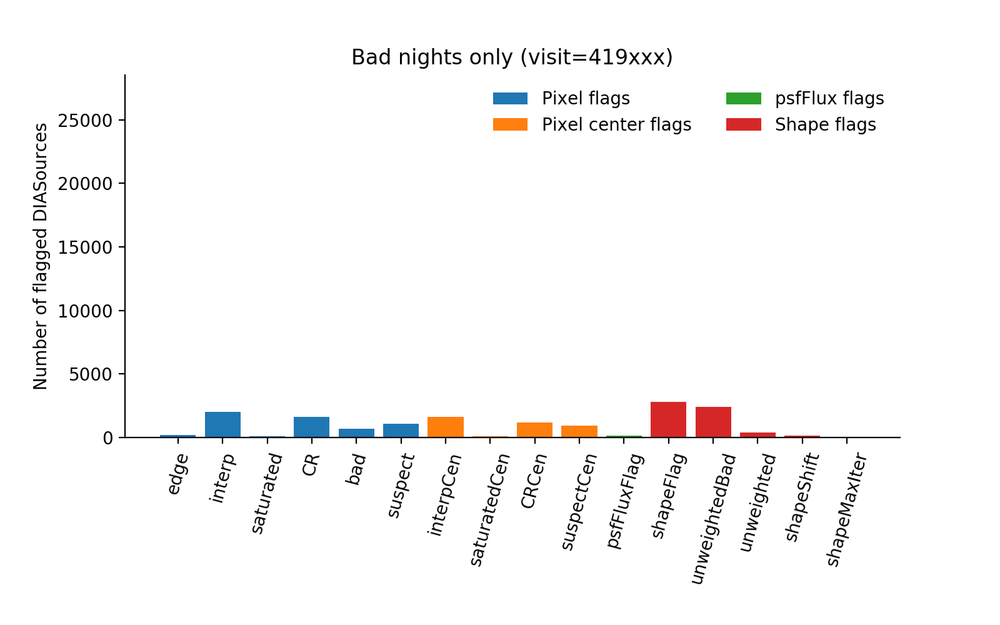

In [108]:
flag_values_badvisits = unpacker.unpack(badVisits['flags'], 'flags')
flagSumBadVisits = pd.DataFrame(flag_values_badvisits, index=badVisits.index).sum()

countFlagSumBadVisits = [count for count in flagSumBadVisits.values if count > 10]
plot_flag_hist(countFlagSumBadVisits, nonzeroLabels, title='Bad nights only (visit=419xxx)')

<IPython.core.display.Javascript object>


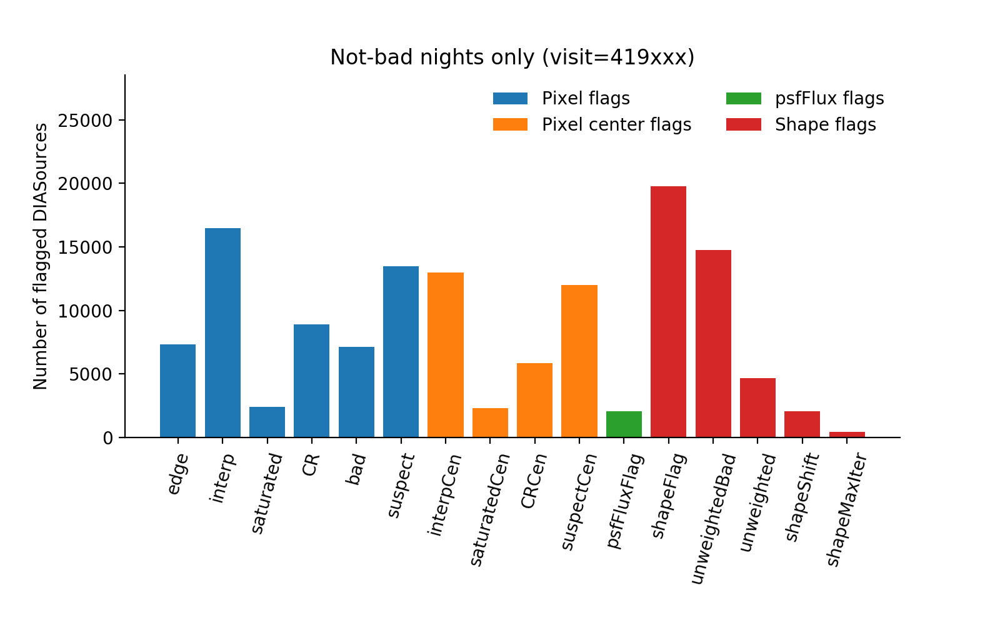

In [109]:
flag_values_notbadvisits = unpacker.unpack(notBadVisits['flags'], 'flags')
flagSumNotBadVisits = pd.DataFrame(flag_values_notbadvisits, index=notBadVisits.index).sum()

countFlagSumNotBadVisits = [count for count in flagSumNotBadVisits.values if count > 10]
plot_flag_hist(countFlagSumNotBadVisits, nonzeroLabels, title='Not-bad nights only (visit=419xxx)')

Hmmm, there is no obvious subset of flags that line up with the spurious sources caused by high sky brightness. Time to make some spatial plots and see if that helps. Reminder: we have two main dataframes.

In [110]:
srcTable[0:3]

,apFlux,apFluxErr,ccdVisitId,decl,diaObjectId,diaSourceId,flags,midPointTai,psFlux,psFluxErr,ra,totFlux,totFluxErr,raObj,decObj
0,287.959046,745.433945,41092910,-5.907236,176492704547471526,176492704547471526,2176,57070.160574,1507.841719,226.007753,155.005946,17875.057609,224.168784,154.989024,-6.006998
1,236.576263,722.143596,41092910,-5.983683,176492704547471534,176492704547471534,159383880,57070.160574,1153.281402,213.625137,155.037101,17564.315773,211.059976,154.989024,-6.006998
2,9.003694,721.827248,41092910,-5.981570,176492704547471540,176492704547471540,328,57070.160574,1088.049979,214.588052,155.054999,17546.294840,211.849709,155.102801,-5.926821


In [111]:
flagTable[0:3]

,base_PixelFlags_flag,base_PixelFlags_flag_offimage,base_PixelFlags_flag_edge,base_PixelFlags_flag_interpolated,base_PixelFlags_flag_saturated,base_PixelFlags_flag_cr,base_PixelFlags_flag_bad,base_PixelFlags_flag_suspect,base_PixelFlags_flag_interpolatedCenter,base_PixelFlags_flag_saturatedCenter,...,slot_PsfFlux_flag_edge,ip_diffim_forced_PsfFlux_flag,ip_diffim_forced_PsfFlux_flag_noGoodPixels,ip_diffim_forced_PsfFlux_flag_edge,slot_Shape_flag,slot_Shape_flag_unweightedBad,slot_Shape_flag_unweighted,slot_Shape_flag_shift,slot_Shape_flag_maxIter,slot_Shape_flag_psf
0,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,True,False,False,True,False,True,False,...,False,False,False,False,True,True,False,False,True,False
2,False,False,False,True,False,False,True,False,True,False,...,False,False,False,False,False,False,False,False,False,False


In [112]:
print(len(srcTable), len(flagTable))
srcTableWithFlags = pd.merge(srcTable, flagTable, left_index=True, right_index=True)

28528 28528


In [113]:
srcTableWithFlags[0:3]

,apFlux,apFluxErr,ccdVisitId,decl,diaObjectId,diaSourceId,flags,midPointTai,psFlux,psFluxErr,...,slot_PsfFlux_flag_edge,ip_diffim_forced_PsfFlux_flag,ip_diffim_forced_PsfFlux_flag_noGoodPixels,ip_diffim_forced_PsfFlux_flag_edge,slot_Shape_flag,slot_Shape_flag_unweightedBad,slot_Shape_flag_unweighted,slot_Shape_flag_shift,slot_Shape_flag_maxIter,slot_Shape_flag_psf
0,287.959046,745.433945,41092910,-5.907236,176492704547471526,176492704547471526,2176,57070.160574,1507.841719,226.007753,...,False,False,False,False,False,False,False,False,False,False
1,236.576263,722.143596,41092910,-5.983683,176492704547471534,176492704547471534,159383880,57070.160574,1153.281402,213.625137,...,False,False,False,False,True,True,False,False,True,False
2,9.003694,721.827248,41092910,-5.981570,176492704547471540,176492704547471540,328,57070.160574,1088.049979,214.588052,...,False,False,False,False,False,False,False,False,False,False


In [114]:
badVisitTable = srcTableWithFlags[srcTableWithFlags['ccdVisitId'].astype(str).str.contains('419')]
notBadVisitTable = srcTableWithFlags[~srcTableWithFlags['ccdVisitId'].astype(str).str.contains('419')]

<IPython.core.display.Javascript object>


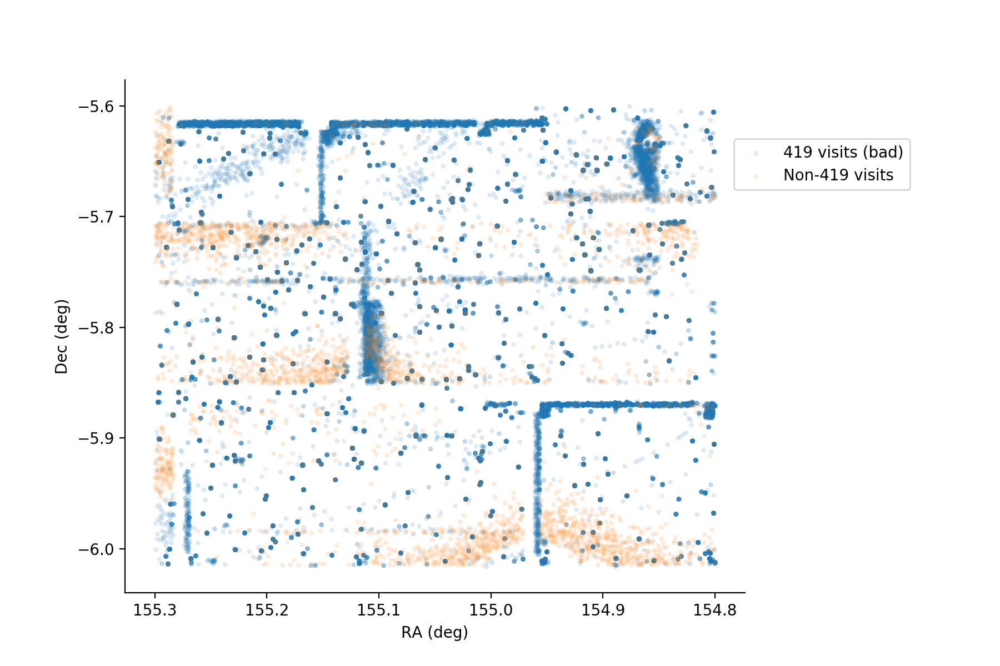

In [123]:
fig = plt.figure(figsize=(9,6))
plt.scatter(notBadVisitTable['ra'], notBadVisitTable['decl'], color='C0', s=5, alpha=0.1, label='419 visits (bad)')
plt.scatter(badVisitTable['ra'], badVisitTable['decl'], color='C1', s=5, alpha=0.1, label='Non-419 visits')
plt.xlabel('RA (deg)')
plt.ylabel('Dec (deg)')
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().invert_xaxis()
box = plt.gca().get_position()
plt.gca().set_position([box.x0, box.y0, box.width * 0.8, box.height])
plt.legend(bbox_to_anchor=(0.97, 0.9))

In [483]:
noRaDec = pd.DataFrame()
yesRaDec = pd.DataFrame()
for index, row in srcTable.iterrows():
    if np.isnan(row['raObj']):
        noRaDec = noRaDec.append(row)
    else:
        yesRaDec = yesRaDec.append(row)

In [484]:
noRaDec['flags'] = np.int64(noRaDec['flags'])  # for some reason everything became float64?
yesRaDec['flags'] = np.int64(yesRaDec['flags'])

In [485]:
flag_values_noRaDec = unpacker.unpack(noRaDec['flags'], 'flags')
flagSumNoRaDec = pd.DataFrame(flag_values_noRaDec, index=noRaDec.index).sum()

flag_values_yesRaDec = unpacker.unpack(yesRaDec['flags'], 'flags')
flagSumYesRaDec = pd.DataFrame(flag_values_yesRaDec, index=yesRaDec.index).sum()

Spatial plot for the most common flag, slot_Shape_flag

In [235]:
def spatial_flag_plot(df, flagName1, flagName2=None, operator=None, plotFlagged=True, plotUnFlagged=True):
    if flagName2 and operator:
        if operator == 'or':
            flagFilter = ((df[flagName1]) | (df[flagName2]))
            labelTrue = flagName1 + ' \nor ' + flagName2
            labelFalse = 'Neither ' + flagName1 + ' \nor ' + flagName2
        elif operator == 'and':
            flagFilter = ((df[flagName1]) & (df[flagName2]))
            labelTrue = 'Both ' + flagName1 + ' \nand ' + flagName2
            labelFalse = 'Not ' + flagName1 + ' \nand ' + flagName2
        else:
            raise ValueError('Operator must be \'and\' or \n \'or\'')
    elif flagName2 and not operator:
        raise ValueError('Operator must be set if a second flag is given')
    else:  # just considering one flag
        flagFilter = (df[flagName1])
        labelTrue = flagName1
        labelFalse = 'No ' + flagName1
    flagFilterInverse = ~flagFilter
    fig, ax = plt.subplots(figsize=(9,6))
    if plotFlagged:
        scatterFlagged = ax.scatter(df.loc[flagFilter, 'ra'], df.loc[flagFilter, 'decl'], 
                    color='C3', s=5, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(df.loc[flagFilterInverse, 'ra'], df.loc[flagFilterInverse, 'decl'], 
                    color='C0', s=5, alpha=0.2, label=labelFalse)
    ax.set_xlabel('RA (deg)')
    ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.invert_xaxis()
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    ax.legend(bbox_to_anchor=(0.97, 0.9))

<IPython.core.display.Javascript object>


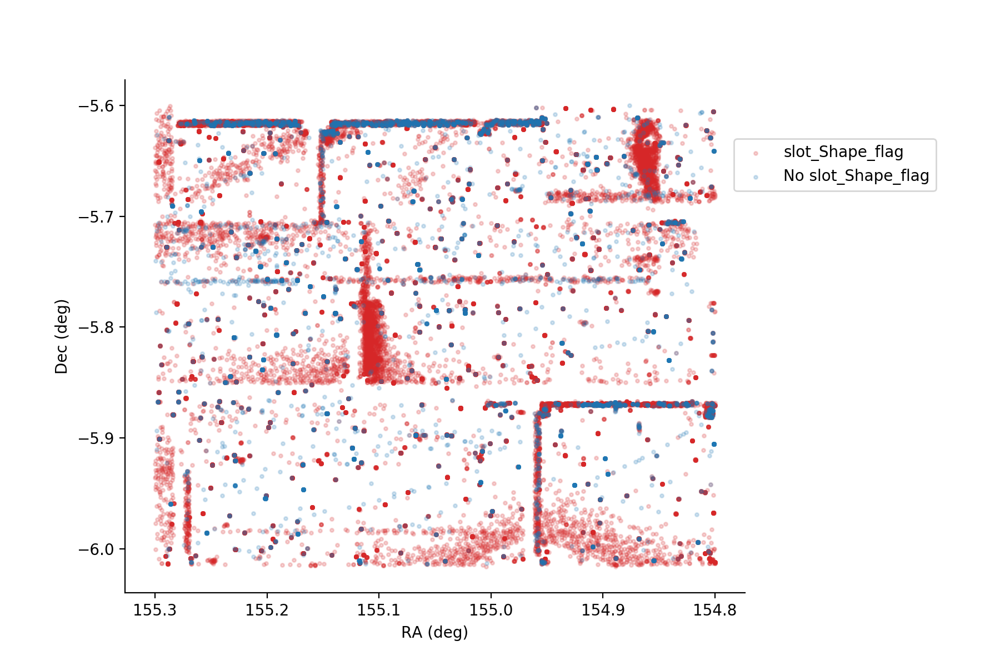

(<matplotlib.collections.PathCollection at 0x7f7db61b2908>,
 <matplotlib.collections.PathCollection at 0x7f7db61b2be0>)

In [236]:
spatial_flag_plot(srcTableWithFlags, 'slot_Shape_flag')

<IPython.core.display.Javascript object>


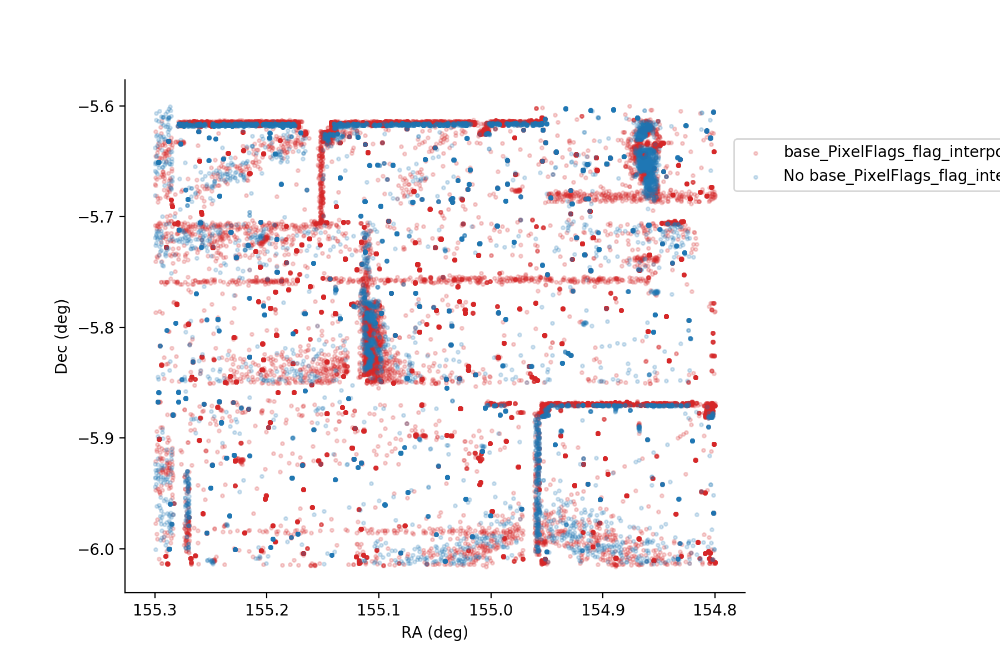

In [190]:
spatial_flag_plot(srcTableWithFlags, 'base_PixelFlags_flag_interpolated')

<IPython.core.display.Javascript object>


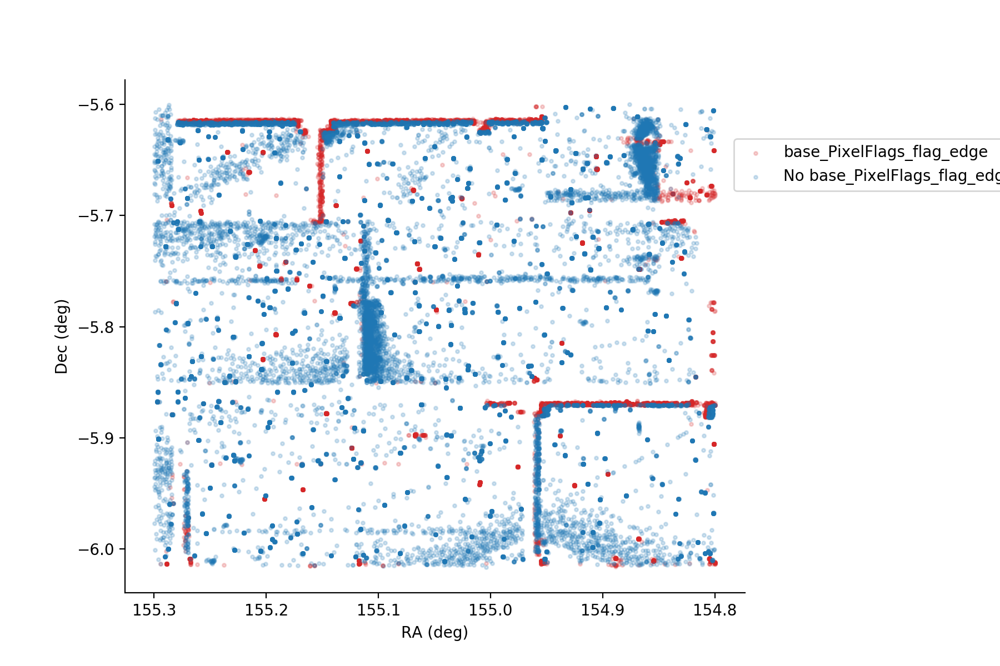

In [191]:
spatial_flag_plot(srcTableWithFlags, 'base_PixelFlags_flag_edge')

<IPython.core.display.Javascript object>


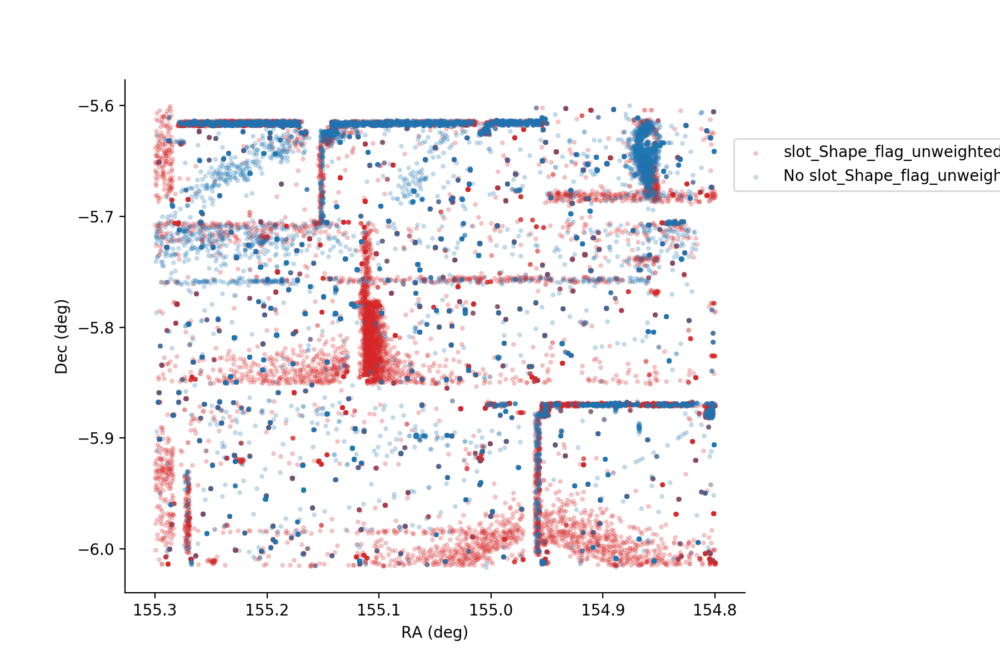

In [201]:
spatial_flag_plot(srcTableWithFlags, 'slot_Shape_flag_unweightedBad')

<IPython.core.display.Javascript object>


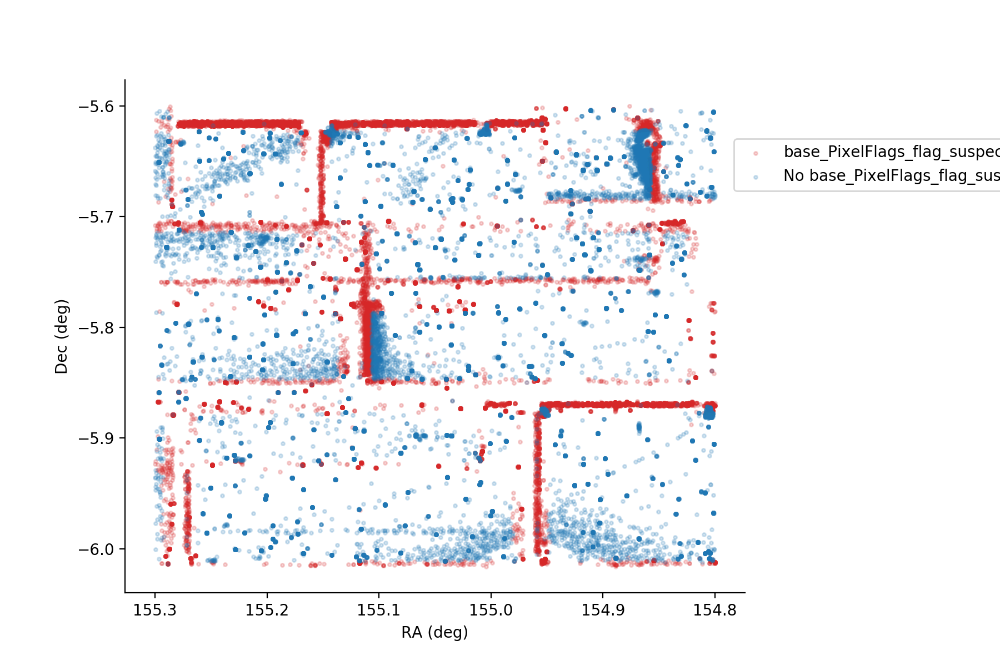

In [202]:
spatial_flag_plot(srcTableWithFlags, 'base_PixelFlags_flag_suspect')

<IPython.core.display.Javascript object>


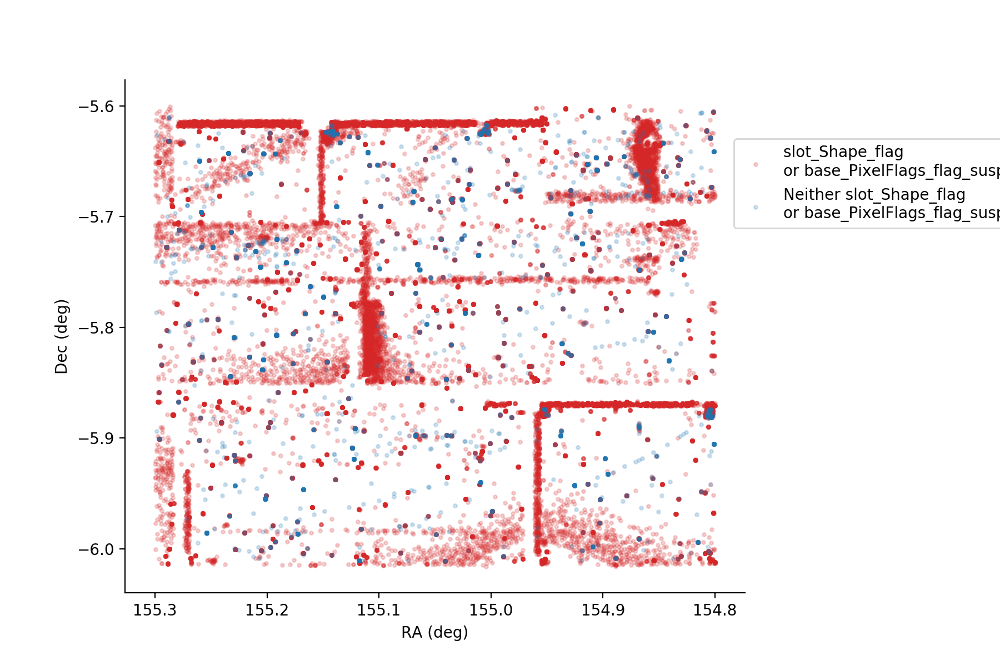

(<matplotlib.collections.PathCollection at 0x7f7db58d7978>,
 <matplotlib.collections.PathCollection at 0x7f7db58d7da0>)

In [261]:
spatial_flag_plot(srcTableWithFlags, 'slot_Shape_flag', 'base_PixelFlags_flag_suspect', operator='or')

<IPython.core.display.Javascript object>


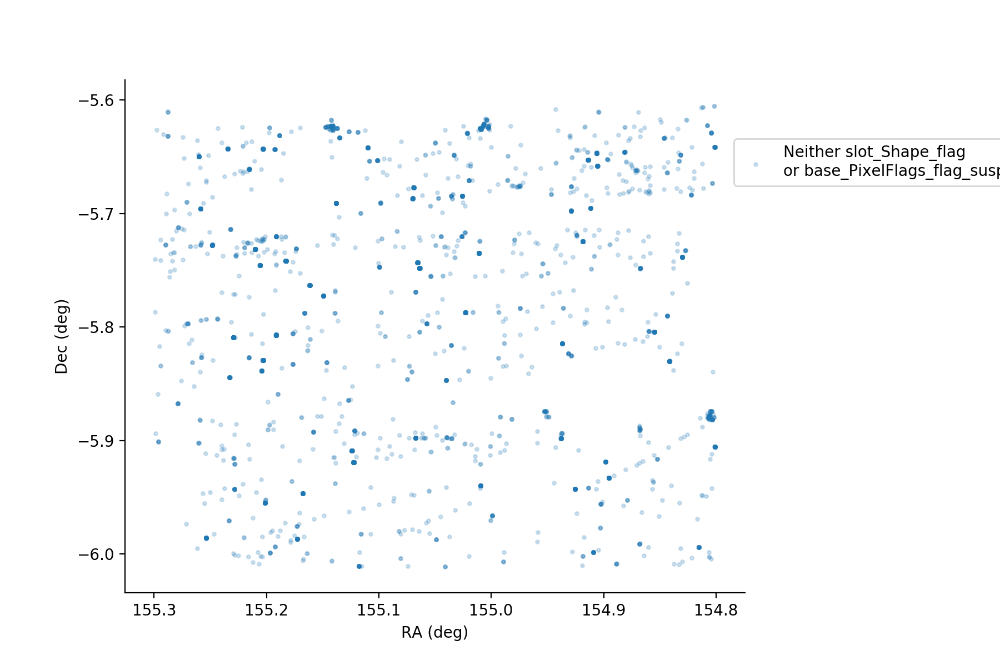

In [205]:
spatial_flag_plot(srcTableWithFlags, 'slot_Shape_flag', 'base_PixelFlags_flag_suspect', operator='or', plotFlagged=False)

<IPython.core.display.Javascript object>


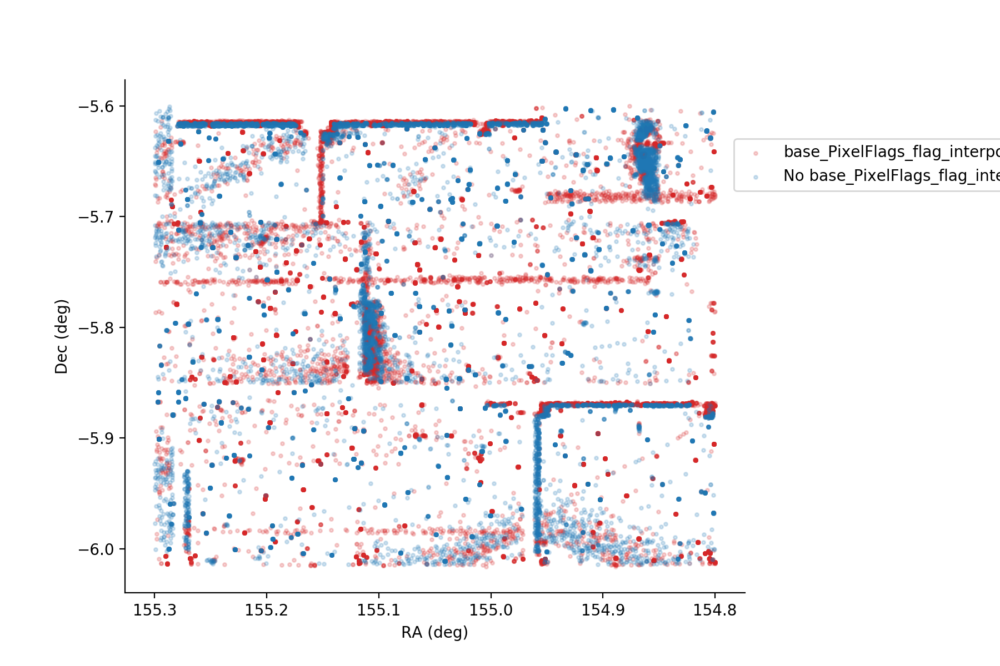

In [206]:
spatial_flag_plot(srcTableWithFlags, 'base_PixelFlags_flag_interpolatedCenter')

<IPython.core.display.Javascript object>


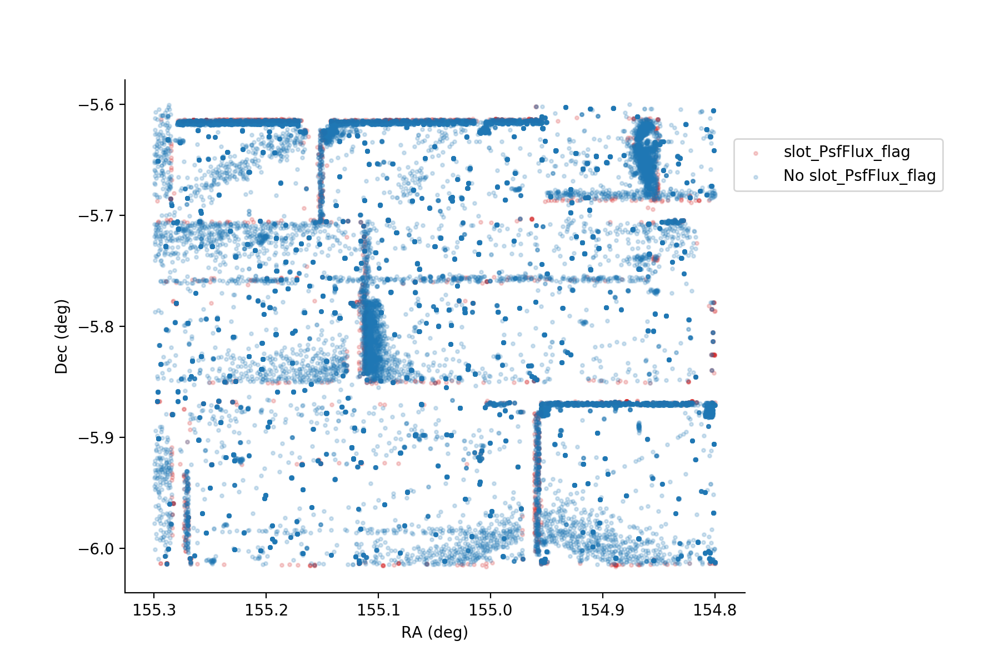

In [211]:
spatial_flag_plot(srcTableWithFlags, 'slot_PsfFlux_flag')

<IPython.core.display.Javascript object>


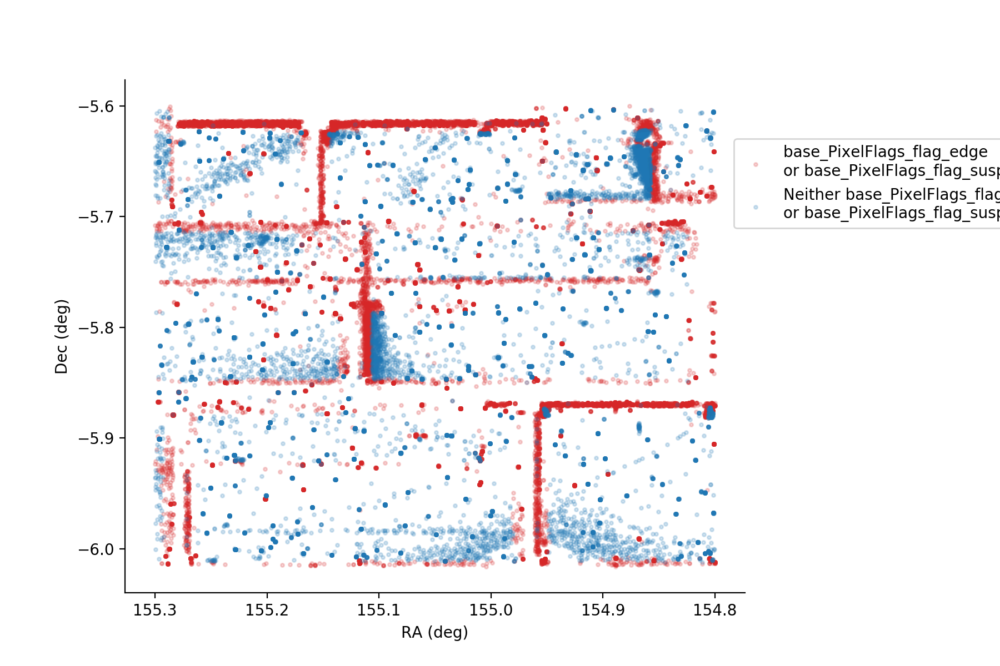

(<Figure size 900x600 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f7db5a999b0>)

In [228]:
spatial_flag_plot(srcTableWithFlags, 'base_PixelFlags_flag_edge', 'base_PixelFlags_flag_suspect', operator='or')

In [242]:
flagListNonzero = [
'base_PixelFlags_flag_edge',
'base_PixelFlags_flag_interpolated',
'base_PixelFlags_flag_saturated',
'base_PixelFlags_flag_cr',
'base_PixelFlags_flag_bad',
'base_PixelFlags_flag_suspect',
'base_PixelFlags_flag_interpolatedCenter',
'base_PixelFlags_flag_saturatedCenter',
'base_PixelFlags_flag_crCenter',
'base_PixelFlags_flag_suspectCenter',
'slot_PsfFlux_flag',
'slot_Shape_flag',
'slot_Shape_flag_unweightedBad',
'slot_Shape_flag_unweighted',
'slot_Shape_flag_shift',
'slot_Shape_flag_maxIter']

<IPython.core.display.Javascript object>


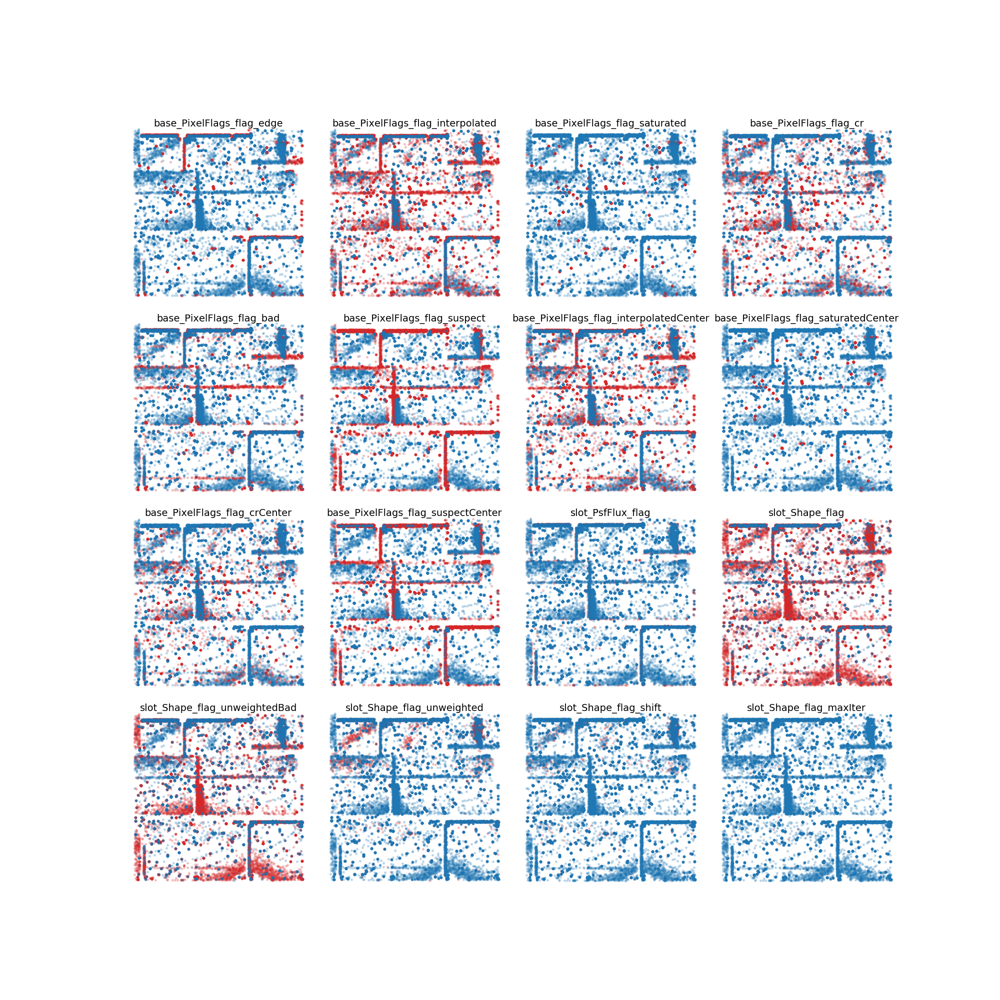

In [259]:
fig = plt.figure(figsize=(10,10))
for idx, flagName in enumerate(flagListNonzero):
    plotFlagged = True
    plotUnFlagged = True
    ax = fig.add_subplot(4, 4, idx+1)
    flagFilter = (srcTableWithFlags[flagName])
    labelTrue = flagName
    labelFalse = 'No ' + flagName
    flagFilterInverse = ~flagFilter
    if plotFlagged:
        scatterFlagged = ax.scatter(srcTableWithFlags.loc[flagFilter, 'ra'], 
                                    srcTableWithFlags.loc[flagFilter, 'decl'], 
                                    color='C3', s=1, alpha=0.2, label=labelTrue)
    if plotUnFlagged:
        scatterUnflagged = ax.scatter(srcTableWithFlags.loc[flagFilterInverse, 'ra'], 
                                      srcTableWithFlags.loc[flagFilterInverse, 'decl'], 
                                      color='C0', s=1, alpha=0.2, label=labelFalse)
    #ax.set_xlabel('RA (deg)')
    #ax.set_ylabel('Dec (deg)')
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    ax.invert_xaxis()
    plt.subplots_adjust(wspace=0.05, hspace=0.05)
    title = plt.title(flagName, size=7)
    title.set_position([0.5, 0.92])